# Cluster Analysis of Manhattan Area Restaurants 

## Objectives:
(Given geo-location, building, time data about the restaurants, etc.)
- 1) Find Patterns that suggest which group of restaurants would be more likely to be successful in future business and which are not.
- 2) Find which variables are more influential on making business more successful 

## Problems:

- 현재의 상태에선 클러스터를 만든다고 해도, 비즈니스 성공을 나타내는 데이터와 연결(병합)되어있지 않아, 유의미한 해석이 불가능함 
- 

In [1]:
#Standards
# -*- coding: utf-8 -*-

import os  #to interact with the OS
import sys  #command line arguments
import re  #string patter matching
import glob  #file wildcards search
import math  
import pickle
import datetime
from time import time
from tqdm import tqdm, tnrange, tqdm_notebook  #progress bar for iteration
from pprint import pprint
import warnings
warnings.filterwarnings('ignore')  #ignore warning msg

#Wrangling
import numpy as np 
import pandas as pd  
import sklearn
import scipy as sp

#Pandas Config.
#For the default setting: reset_option(param) 
pd.set_option("display.max_rows", 100)  #출력할 행의 수
pd.set_option('display.max_columns', None)  #출력할 열의 수; None for the entire columns
pd.set_option('display.max_colwidth', 1000)  #열의 너비; None for the entire columns
pd.set_option('display.float_format', lambda x: '%.3f' % x)  # Format scientific notation from Pandas
#pd.options.display.float_format = '{:.5f}'.format

# Ignore warnings
import warnings
warnings.filterwarnings('ignore', category = FutureWarning)

%autosave 120

Autosaving every 120 seconds


In [2]:
#Visualization
import matplotlib
import matplotlib.pyplot as plt  #visualization
from matplotlib import font_manager, rc #Matplotlib Config.
import seaborn as sns 

#interactive viz
import ipywidgets as widgets
from IPython.display import display

rc('font', family='AppleGothic')
matplotlib.style.use('ggplot')  #fivethirtyeight, seaborn
plt.rcParams['figure.figsize'] = (8, 6)
# plt.rcParams['font.family'] = 'serif'  #serif
# plt.rcParams['font.serif'] = 'Ubuntu'
# plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.labelsize'] = 8
plt.rcParams['ytick.labelsize'] = 8
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 12
plt.rcParams['axes.unicode_minus'] = False  #마이너스 깨짐 현상
# import matplotlib as mpl
# mpl.rc("figure", figsize=(24,12))

%matplotlib inline

In [3]:
# !pwd

In [4]:
path = "../data/raw/"
# restaurant = pd.read_csv(path+"restaurant.csv").iloc[:,1:]
review = pd.read_csv(path + "restaurant_review.csv")
traffic = pd.read_csv(path + "traffic_count.csv")
# building = pd.read_csv(path+"building_240324_1212.csv")
# building = pd.read_csv(path + "building_240327_1826.csv")
building = pd.read_csv("../data/processed/building/building_240405_1230.csv")
bankrupt = pd.read_csv("../data/processed/20240404_bankrupt_restaurants.csv")

In [5]:
building.head()

,height,mpluto_bbl,cnstrct_yr,globalid,bin,office_area,retail_area,residential_area,OBJECTID,street_width_min,street_width_max,posted_speed,betweeness,station_complex_id,ridership_evening,ridership_late_night,ridership_midday,ridership_morning,ridership_night,distance_from_station(ft),idw_aadt_2019,idw_aadt_2020,idw_aadt_2021,idw_atvc_2018,idw_atvc_2019,idw_atvc_2020,office_within_450ft,retail_within_450ft,residential_within_450ft,distance_to_park,distance_to_school
0,59.723,1021210037,1910.000,{A0E56BCC-A86B-4CEF-9A42-9B4ECD61743F},1062896,0,2250,10344,100007,60.000,60.000,25,0.012,149,54.059,22.605,104.186,104.288,19.346,705.645,13651.723,15362.930,17083.134,110.061,140.829,332.411,5550,59662,898416,79.391,144.771
1,155.490,1008870001,1935.000,{0B06F7A8-1F83-44F3-97DD-AC524A6374CA},1018457,50018,4000,0,101045,32.000,32.000,25,0.028,403,666.520,54.499,589.012,290.296,248.617,302.952,10065.446,10282.944,11495.144,129.011,178.320,272.447,2550406,351887,1164766,727.737,544.998
2,167.214,1013490035,1931.000,{A091951D-C73E-4B77-9A61-716C666C5446},1039988,2890,0,70110,99804,60.000,60.000,25,0.012,612,1625.486,98.033,1074.659,341.607,460.167,1397.998,14437.630,14445.844,16299.638,151.953,174.349,240.654,170032,135993,3123941,619.229,848.839
3,28.570,1010610006,1910.000,{2BE9F674-67E7-4A49-8535-F636A16D8DA5},1026714,0,0,0,103068,32.000,32.000,25,0.023,162,489.674,80.554,498.985,220.548,326.712,1620.037,10455.418,10087.378,11238.596,163.403,182.998,237.267,228739,75352,1677852,363.175,326.218
4,73.130,1003060013,1900.000,{2403088E-77A6-4071-8B5E-D54AFBC720D9},1003956,0,3800,0,92425,34.000,45.000,25,0.034,231,687.781,58.691,674.359,211.021,295.261,291.564,7632.300,7433.878,8351.143,105.344,137.101,350.242,99564,185023,676931,73.236,490.774


In [6]:
building.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37409 entries, 0 to 37408
Data columns (total 31 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   height                     37200 non-null  float64
 1   mpluto_bbl                 37409 non-null  int64  
 2   cnstrct_yr                 36751 non-null  float64
 3   globalid                   37409 non-null  object 
 4   bin                        37409 non-null  int64  
 5   office_area                37409 non-null  int64  
 6   retail_area                37409 non-null  int64  
 7   residential_area           37409 non-null  int64  
 8   OBJECTID                   37409 non-null  int64  
 9   street_width_min           33284 non-null  float64
 10  street_width_max           33226 non-null  float64
 11  posted_speed               37409 non-null  object 
 12  betweeness                 37409 non-null  float64
 13  station_complex_id         37409 non-null  int

In [7]:
review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3057 entries, 0 to 3056
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   neighborhood        3057 non-null   object 
 1   name                3057 non-null   object 
 2   place_id            3057 non-null   object 
 3   price_level         2870 non-null   float64
 4   rating              3057 non-null   float64
 5   user_ratings_total  3057 non-null   int64  
 6   business_status     3057 non-null   object 
 7   adr_address         0 non-null      float64
 8   formatted_address   3057 non-null   object 
 9   lat                 3057 non-null   float64
 10  lng                 3057 non-null   float64
 11  bin                 3057 non-null   int64  
 12  distance            3057 non-null   float64
dtypes: float64(6), int64(2), object(5)
memory usage: 310.6+ KB


In [8]:
building.groupby("bin").size().sort_values(ascending=False)

bin
1000002    1
1059809    1
1059790    1
1059791    1
1059792    1
          ..
1030539    1
1030540    1
1030541    1
1030543    1
3425828    1
Length: 37409, dtype: int64

In [9]:
review.sort_values("name")

,neighborhood,name,place_id,price_level,rating,user_ratings_total,business_status,adr_address,formatted_address,lat,lng,bin,distance
2413,Hudson Heights,1601 Dominican Valle Restaurant,ChIJLQSqXhv0wokRHnXgtBBBn-M,2.000,3.800,116,OPERATIONAL,NaN,"1601 St Nicholas Ave, New York, NY 10040",40.855,-73.930,1064035,0.000
784,NoHo,218 Restaurant,ChIJY6y3bohZwokR0wAvTPRvLAM,1.000,4.200,167,OPERATIONAL,NaN,"218 Grand St, New York, NY 10013",40.719,-73.996,1006933,0.000
581,Kip's Bay,218 Restaurant,ChIJY6y3bohZwokR0wAvTPRvLAM,1.000,4.200,167,OPERATIONAL,NaN,"218 Grand St, New York, NY 10013",40.719,-73.996,1006933,0.000
1920,Flatiron District,218 Restaurant,ChIJY6y3bohZwokR0wAvTPRvLAM,1.000,4.200,167,OPERATIONAL,NaN,"218 Grand St, New York, NY 10013",40.719,-73.996,1006933,0.000
684,Meatpacking District,218 Restaurant,ChIJY6y3bohZwokR0wAvTPRvLAM,1.000,4.200,167,OPERATIONAL,NaN,"218 Grand St, New York, NY 10013",40.719,-73.996,1006933,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1529,Midtown East,wagamama,ChIJucC69nVZwokRmziSfSAfhFA,2.000,4.300,669,OPERATIONAL,NaN,"100 W 55th St, New York, NY 10019",40.763,-73.979,1083719,0.000
759,Murray Hill,wagamama,ChIJucC69nVZwokRmziSfSAfhFA,2.000,4.300,669,OPERATIONAL,NaN,"100 W 55th St, New York, NY 10019",40.763,-73.979,1083719,0.000
1586,Sutton Place,wagamama,ChIJucC69nVZwokRmziSfSAfhFA,2.000,4.300,669,OPERATIONAL,NaN,"100 W 55th St, New York, NY 10019",40.763,-73.979,1083719,0.000
1360,Columbus Circle,wagamama,ChIJucC69nVZwokRmziSfSAfhFA,2.000,4.300,669,OPERATIONAL,NaN,"100 W 55th St, New York, NY 10019",40.763,-73.979,1083719,0.000


In [10]:
bankrupt.head()

,Unnamed: 0,bin,camis,boro,zipcode,cuisine_description,inspection_date_Ymd,inspection_year,inspection_date_Ymd_next,days_next_inspection,flag_restaurant_one_year,latitude,longitude
0,0,1005982.000,50104748,Manhattan,10009.000,Hamburgers,2021-11-10,2021,2021-11-10,0,1,40.730,-73.983
1,1,1005887.000,50101123,Manhattan,10009.000,Korean,2021-11-09,2021,2021-11-09,0,1,40.727,-73.985
2,2,1069590.000,50061569,Manhattan,10019.000,American,2017-04-24,2017,2017-04-24,0,1,40.763,-73.981
3,3,1064818.000,50090999,Manhattan,10040.000,Tex-Mex,2019-05-30,2019,2020-02-14,260,0,40.864,-73.926
4,4,1028585.000,50076936,Manhattan,10023.000,Pizza,2018-06-13,2018,2018-06-13,0,1,40.776,-73.979


In [11]:
bankrupt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3115 entries, 0 to 3114
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                3115 non-null   int64  
 1   bin                       3085 non-null   float64
 2   camis                     3115 non-null   int64  
 3   boro                      3115 non-null   object 
 4   zipcode                   3115 non-null   float64
 5   cuisine_description       3115 non-null   object 
 6   inspection_date_Ymd       3115 non-null   object 
 7   inspection_year           3115 non-null   int64  
 8   inspection_date_Ymd_next  3115 non-null   object 
 9   days_next_inspection      3115 non-null   int64  
 10  flag_restaurant_one_year  3115 non-null   int64  
 11  latitude                  3108 non-null   float64
 12  longitude                 3108 non-null   float64
dtypes: float64(4), int64(5), object(4)
memory usage: 316.5+ KB


In [12]:
bankrupt.isnull().sum()

Unnamed: 0                   0
bin                         30
camis                        0
boro                         0
zipcode                      0
cuisine_description          0
inspection_date_Ymd          0
inspection_year              0
inspection_date_Ymd_next     0
days_next_inspection         0
flag_restaurant_one_year     0
latitude                     7
longitude                    7
dtype: int64

# EDA

## null handling

In [13]:
print(len(review), len(building), len(bankrupt))

3057 37409 3115


In [14]:
# building data는 있는데 review는 없는 경우는, 리뷰가 존재하지 않는 경우로 보고 null처리를 다른 대체값으로 해야할지?
# 이 경우가 어떤 경우들인지?
df = building.merge(review, on="bin", how="inner")
# review.merge(building, on="bin", how="inner")

In [15]:
df.merge(bankrupt, on="bin", how="inner")

,height,mpluto_bbl,cnstrct_yr,globalid,bin,office_area,retail_area,residential_area,OBJECTID,street_width_min,street_width_max,posted_speed,betweeness,station_complex_id,ridership_evening,ridership_late_night,ridership_midday,ridership_morning,ridership_night,distance_from_station(ft),idw_aadt_2019,idw_aadt_2020,idw_aadt_2021,idw_atvc_2018,idw_atvc_2019,idw_atvc_2020,office_within_450ft,retail_within_450ft,residential_within_450ft,distance_to_park,distance_to_school,neighborhood,name,place_id,price_level,rating,user_ratings_total,business_status,adr_address,formatted_address,lat,lng,distance,Unnamed: 0,camis,boro,zipcode,cuisine_description,inspection_date_Ymd,inspection_year,inspection_date_Ymd_next,days_next_inspection,flag_restaurant_one_year,latitude,longitude
0,71.520,1004500003,1938.000,{63A00CDC-1F33-4C4C-BB0A-E3E0CD7E5BEB},1079104,12877,5328,13735,104709,58.000,58.000,25,0.046,407,379.489,69.629,347.542,189.587,263.315,1140.867,9224.519,9357.208,10454.826,124.785,139.769,321.254,94785,194595,1031782,422.744,847.261,Alphabet City,SAINT RESTAURANT BAR & SPEAKEASY,ChIJ6atD-WRZwokRULgcZ4TWin8,3.000,4.500,655,OPERATIONAL,NaN,"136 2nd Ave, New York, NY 10003",40.729,-73.987,0.000,1877,50096959,Manhattan,10003.000,French,2021-11-09,2021,2021-11-09,0,1,40.729,-73.987
1,71.520,1004500003,1938.000,{63A00CDC-1F33-4C4C-BB0A-E3E0CD7E5BEB},1079104,12877,5328,13735,104709,58.000,58.000,25,0.046,407,379.489,69.629,347.542,189.587,263.315,1140.867,9224.519,9357.208,10454.826,124.785,139.769,321.254,94785,194595,1031782,422.744,847.261,Battery Park City,SAINT RESTAURANT BAR & SPEAKEASY,ChIJ6atD-WRZwokRULgcZ4TWin8,3.000,4.500,655,OPERATIONAL,NaN,"136 2nd Ave, New York, NY 10003",40.729,-73.987,0.000,1877,50096959,Manhattan,10003.000,French,2021-11-09,2021,2021-11-09,0,1,40.729,-73.987
2,71.520,1004500003,1938.000,{63A00CDC-1F33-4C4C-BB0A-E3E0CD7E5BEB},1079104,12877,5328,13735,104709,58.000,58.000,25,0.046,407,379.489,69.629,347.542,189.587,263.315,1140.867,9224.519,9357.208,10454.826,124.785,139.769,321.254,94785,194595,1031782,422.744,847.261,The Bowery,SAINT RESTAURANT BAR & SPEAKEASY,ChIJ6atD-WRZwokRULgcZ4TWin8,3.000,4.500,655,OPERATIONAL,NaN,"136 2nd Ave, New York, NY 10003",40.729,-73.987,0.000,1877,50096959,Manhattan,10003.000,French,2021-11-09,2021,2021-11-09,0,1,40.729,-73.987
3,71.520,1004500003,1938.000,{63A00CDC-1F33-4C4C-BB0A-E3E0CD7E5BEB},1079104,12877,5328,13735,104709,58.000,58.000,25,0.046,407,379.489,69.629,347.542,189.587,263.315,1140.867,9224.519,9357.208,10454.826,124.785,139.769,321.254,94785,194595,1031782,422.744,847.261,Chinatown,SAINT RESTAURANT BAR & SPEAKEASY,ChIJ6atD-WRZwokRULgcZ4TWin8,3.000,4.500,655,OPERATIONAL,NaN,"136 2nd Ave, New York, NY 10003",40.729,-73.987,0.000,1877,50096959,Manhattan,10003.000,French,2021-11-09,2021,2021-11-09,0,1,40.729,-73.987
4,71.520,1004500003,1938.000,{63A00CDC-1F33-4C4C-BB0A-E3E0CD7E5BEB},1079104,12877,5328,13735,104709,58.000,58.000,25,0.046,407,379.489,69.629,347.542,189.587,263.315,1140.867,9224.519,9357.208,10454.826,124.785,139.769,321.254,94785,194595,1031782,422.744,847.261,East Village,SAINT RESTAURANT BAR & SPEAKEASY,ChIJ6atD-WRZwokRULgcZ4TWin8,3.000,4.500,655,OPERATIONAL,NaN,"136 2nd Ave, New York, NY 10003",40.729,-73.987,0.000,1877,50096959,Manhattan,10003.000,French,2021-11-09,2021,2021-11-09,0,1,40.729,-73.987
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1161,221.000,1005357501,1908.000,{FA89D6E9-6249-4C35-9287-DCCAC0C6A5F9},1008629,0,32600,290492,101231,30.000,32.000,25,0.021,619,1188.862,121.433,867.521,255.073,543.931,738.566,6735.126,6812.527,7682.933,127.021,138.430,320.412,1002978,347734,758979,93.783,730.525,Lower East Side,DIG,ChIJE8C9yspZwokRll_tX45HV8M,1.000,4.000,291,OPERATIONAL,NaN,"691 Broadway, New York, NY 10012",40.728,-73.995,0.000,1665,50086803,Manhattan,10012.000,Amer

<Axes: >

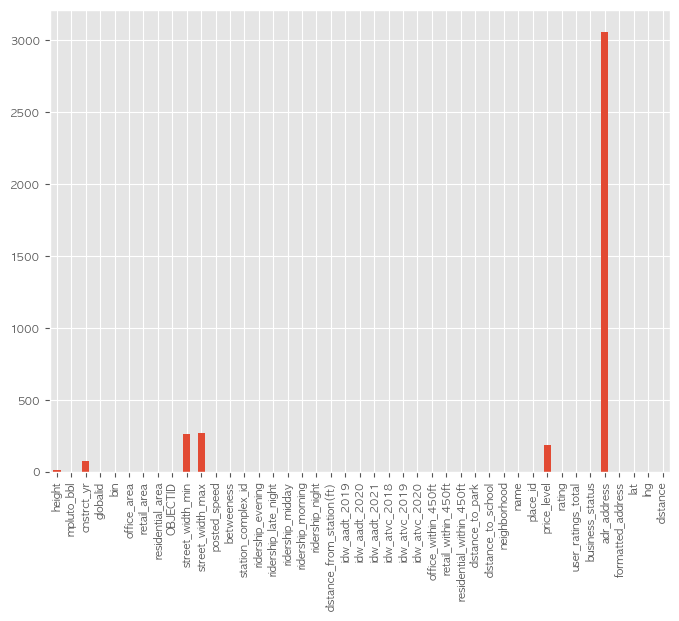

In [16]:
# vis of null values

# df.isnull().sum()
df.isnull().sum().plot(kind="bar")

In [17]:
# df = building.copy()
df = df[
    [
        "bin",
        "name",
        # "place_id",
        # "price_level",
        "rating",
        "user_ratings_total",
        # "business_status",
        # "adr_address",
        # "formatted_address",
        "lat",
        "lng",
        "distance",
        "cnstrct_yr",
        "height",
        # 'mpluto_bbl',
        # 'globalid',
        "office_area",
        "retail_area",
        "residential_area",
        # 'OBJECTID',
        # "street_width_min",
        # "street_width_max",
        # "posted_speed",
        "betweeness",
        # 'GTFS Stop ID',
        "ridership_evening",
        "ridership_late_night",
        "ridership_midday",
        "ridership_morning",
        "ridership_night",
        "distance_from_station(ft)",
        "idw_aadt_2019",
        "idw_aadt_2020",
        # 'idw_aadt_2021',
        # 'idw_atvc_2018',
        "idw_atvc_2019",
        "idw_atvc_2020",
    ]
]

In [18]:
df.groupby("bin").size().sort_values(ascending=False)

bin
1018102    36
1010268    35
1089338    35
1019591    34
1013076    34
           ..
1061564     1
1006963     1
1079496     1
1006965     1
1023760     1
Length: 251, dtype: int64

In [14]:
df.to_csv("sample.csv", index=False)

In [15]:
df.head()

,bin,name,rating,user_ratings_total,lat,lng,distance,cnstrct_yr,height,office_area,retail_area,residential_area,betweeness,ridership_evening,ridership_late_night,ridership_midday,ridership_morning,ridership_night,distance_from_station(ft),idw_aadt_2019,idw_aadt_2020,idw_atvc_2019,idw_atvc_2020
0,1025437,Guantanamera,4.400,2707,40.766,-73.984,19.240,1925.000,51.360,0,2287,4500,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133
1,1025437,Guantanamera,4.400,2707,40.766,-73.984,19.240,1925.000,51.360,0,2287,4500,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133
2,1025437,Guantanamera,4.400,2707,40.766,-73.984,19.240,1925.000,51.360,0,2287,4500,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133
3,1025437,Guantanamera,4.400,2707,40.766,-73.984,19.240,1925.000,51.360,0,2287,4500,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133
4,1025437,Guantanamera,4.400,2707,40.766,-73.984,19.240,1925.000,51.360,0,2287,4500,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133


In [16]:
df.isnull().sum()

bin                           0
name                          0
rating                        0
user_ratings_total            0
lat                           0
lng                           0
distance                      0
cnstrct_yr                   74
height                       10
office_area                   0
retail_area                   0
residential_area              0
betweeness                    0
ridership_evening             0
ridership_late_night          0
ridership_midday              0
ridership_morning             0
ridership_night               0
distance_from_station(ft)     0
idw_aadt_2019                 0
idw_aadt_2020                 0
idw_atvc_2019                 0
idw_atvc_2020                 0
dtype: int64

In [17]:
df.dropna(inplace=True)

## business_status(drop)

In [18]:
df.business_status.value_counts()

AttributeError: 'DataFrame' object has no attribute 'business_status'

## contruction year

In [74]:
df["cnstrct_yr"].describe()

count   2973.000
mean    1923.067
std       26.321
min     1828.000
25%     1910.000
50%     1920.000
75%     1930.000
max     2019.000
Name: cnstrct_yr, dtype: float64

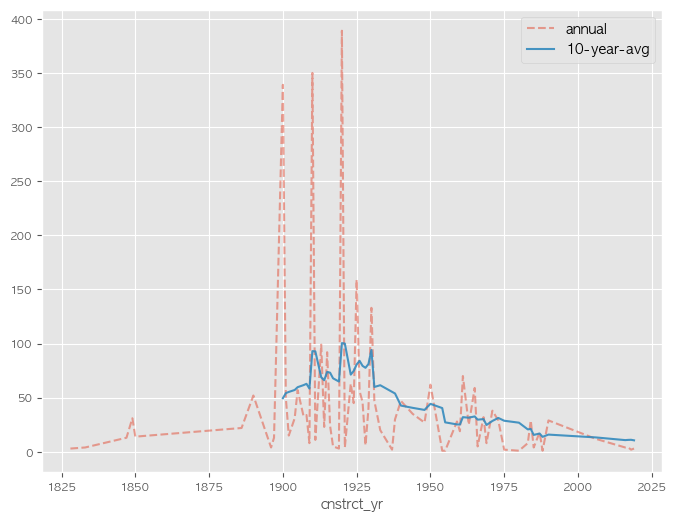

In [73]:
df.groupby("cnstrct_yr").size().plot(alpha=0.5, linestyle="--", label="annual")
df.groupby("cnstrct_yr").size().rolling(10).mean().plot(alpha=0.9, label="10-year-avg")
# df.groupby("cnstrct_yr").size().rolling(30).mean().plot(alpha=.9)

plt.legend()

## height
- probably in ft unit
- mean=88, but max=1550, suggesting there would be long-tailed distribution(right-skewed)

In [75]:
df["height"].describe()

count   2973.000
mean     124.644
std      136.163
min       13.350
25%       51.360
50%       64.000
75%      158.260
max      673.500
Name: height, dtype: float64

{'whiskers': [<matplotlib.lines.Line2D at 0x2b2f3df90>,
 'caps': [<matplotlib.lines.Line2D at 0x2b2f3f350>,
 'boxes': [<matplotlib.lines.Line2D at 0x2b2e7a410>],
 'medians': [<matplotlib.lines.Line2D at 0x2b2f50510>],
 'fliers': [<matplotlib.lines.Line2D at 0x2b2f50d50>],
 'means': []}

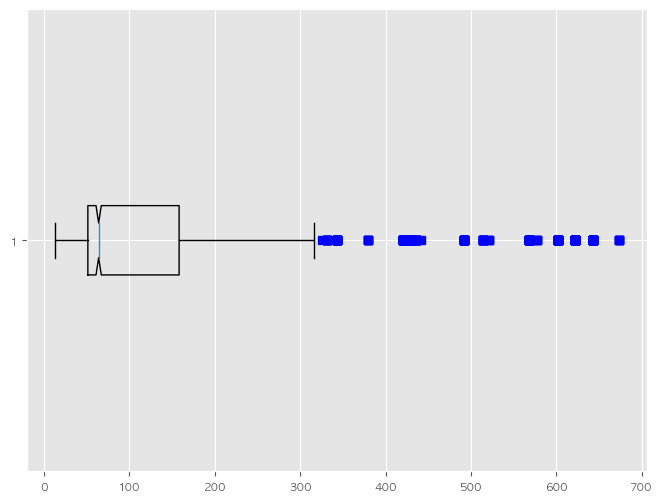

In [76]:
plt.boxplot(
    df[df["height"].lt(1600)]["height"],
    notch=1,  # if 'True' then notched box plot
    sym="bs",  # symbol: red square
    vert=0,  # vertical : if 'False' then horizontal box plot
)

# plt.ylim([0, 1600])

## area_type(drop)
- office/retail/residential ==> make it categorical?
- it could be transformed into one column containing all three columns?
- theoretically, possible options: OF, RT, RS, and, OFRT, OFRS, RTRS, ALL, NA
- in this case, it may lose info about the ratio of occupied area by the respective type
- it might be better to simply use it as is, or implement PCA 

In [89]:
df["area_type"] = np.where(
    (df["office_area"].ne(0))
    & (df["retail_area"].ne(0))
    & (df["residential_area"].ne(0)),
    "ALL",
    np.where(
        (df["office_area"].ne(0)) & (df["retail_area"].ne(0)),
        "OFRT",
        np.where(
            (df["office_area"].ne(0)) & (df["residential_area"].ne(0)),
            "OFRS",
            np.where(
                (df["retail_area"].ne(0)) & (df["residential_area"].ne(0)),
                "RTRS",
                np.where(
                    df["office_area"].ne(0),
                    "OF",
                    np.where(
                        df["retail_area"].ne(0),
                        "RT",
                        np.where(df["residential_area"].ne(0), "RS", "NA"),
                    ),
                ),
            ),
        ),
    ),
)

<Axes: xlabel='area_type'>

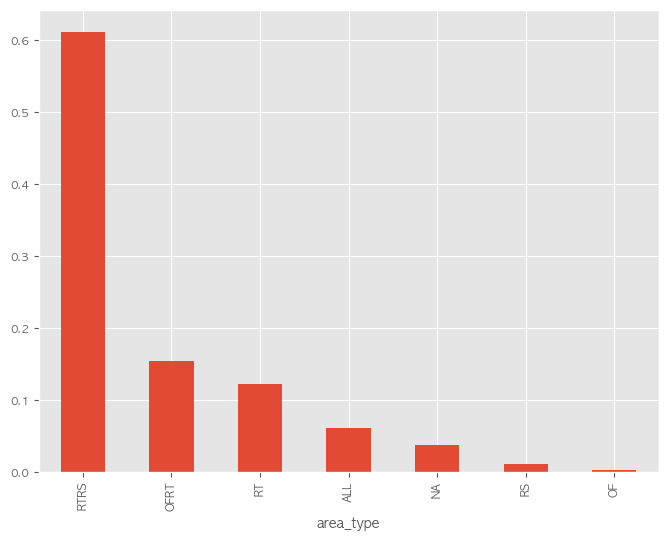

In [90]:
# df.head(30)
df["area_type"].value_counts(normalize=True).plot(kind="bar")

In [91]:
df.head()

,bin,name,rating,user_ratings_total,business_status,lat,lng,distance,cnstrct_yr,height,office_area,retail_area,residential_area,betweeness,ridership_evening,ridership_late_night,ridership_midday,ridership_morning,ridership_night,distance_from_station(ft),idw_aadt_2019,idw_aadt_2020,idw_atvc_2019,idw_atvc_2020,area_type
0,1025437,Guantanamera,4.400,2707,OPERATIONAL,40.766,-73.984,19.240,1925.000,51.360,0,2287,4500,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133,RTRS
1,1025437,Guantanamera,4.400,2707,OPERATIONAL,40.766,-73.984,19.240,1925.000,51.360,0,2287,4500,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133,RTRS
2,1025437,Guantanamera,4.400,2707,OPERATIONAL,40.766,-73.984,19.240,1925.000,51.360,0,2287,4500,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133,RTRS
3,1025437,Guantanamera,4.400,2707,OPERATIONAL,40.766,-73.984,19.240,1925.000,51.360,0,2287,4500,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133,RTRS
4,1025437,Guantanamera,4.400,2707,OPERATIONAL,40.766,-73.984,19.240,1925.000,51.360,0,2287,4500,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133,RTRS


In [104]:
df.groupby("area_type")["rating"].describe()

,count,mean,std,min,25%,50%,75%,max
area_type,,,,,,,,
ALL,185.000,4.407,0.143,4.100,4.300,4.500,4.500,4.700
NA,114.000,4.518,0.173,4.200,4.300,4.500,4.600,4.800
OF,10.000,4.300,0.000,4.300,4.300,4.300,4.300,4.300
OFRT,470.000,4.359,0.157,3.300,4.300,4.400,4.500,4.600
RS,33.000,4.570,0.354,4.100,4.300,4.300,5.000,5.000
RT,375.000,4.273,0.281,3.400,4.100,4.300,4.400,4.900
RTRS,1870.000,4.380,0.452,0.000,4.300,4.400,4.600,5.000


In [103]:
# # ridership by area_type vis
# fig, ax = plt.subplots(2, 4, figsize=(15, 5), sharex=True, sharey=True)

# # kdeplot
# sns.kdeplot(df[df["area_type"].eq("ALL")]["ridership_midday"], ax=ax[0][0])
# ax[0][0].set_title("ALL")

# sns.kdeplot(df[df["area_type"].eq("RTRS")]["ridership_midday"], ax=ax[0][1])
# ax[0][1].set_title("RTRS")

# sns.kdeplot(df[df["area_type"].eq("RS")]["ridership_midday"], ax=ax[0][2])
# ax[0][2].set_title("RS")

# sns.kdeplot(df[df["area_type"].eq("RT")]["ridership_midday"], ax=ax[0][3])
# ax[0][3].set_title("RT")

# sns.kdeplot(df[df["area_type"].eq("OF")]["ridership_midday"], ax=ax[1][0])
# ax[1][0].set_title("OF")

# sns.kdeplot(df[df["area_type"].eq("OFRS")]["ridership_midday"], ax=ax[1][1])
# ax[1][1].set_title("OFRS")

# sns.kdeplot(df[df["area_type"].eq("OFRT")]["ridership_midday"], ax=ax[1][2])
# ax[1][2].set_title("OFRT")

Text(0.5, 1.0, 'OFRT')

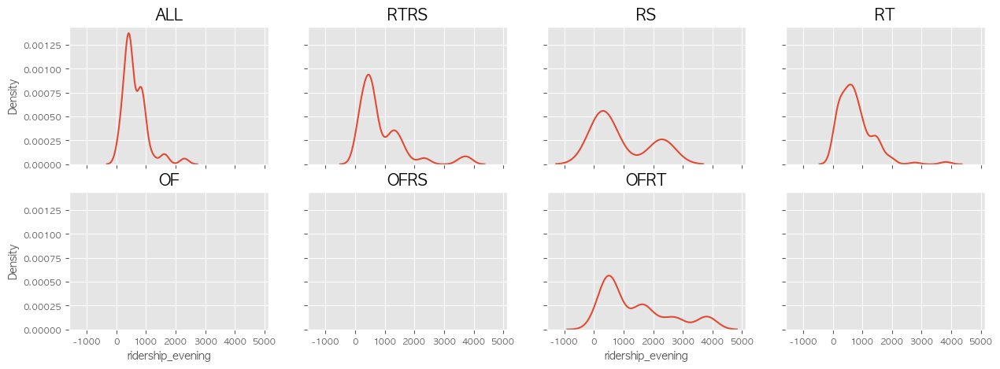

In [101]:
# ridership by area_type vis
fig, ax = plt.subplots(2, 4, figsize=(15, 5), sharex=True, sharey=True)

# kdeplot
sns.kdeplot(df[df["area_type"].eq("ALL")]["ridership_evening"], ax=ax[0][0])
ax[0][0].set_title("ALL")

sns.kdeplot(df[df["area_type"].eq("RTRS")]["ridership_evening"], ax=ax[0][1])
ax[0][1].set_title("RTRS")

sns.kdeplot(df[df["area_type"].eq("RS")]["ridership_evening"], ax=ax[0][2])
ax[0][2].set_title("RS")

sns.kdeplot(df[df["area_type"].eq("RT")]["ridership_evening"], ax=ax[0][3])
ax[0][3].set_title("RT")

sns.kdeplot(df[df["area_type"].eq("OF")]["ridership_evening"], ax=ax[1][0])
ax[1][0].set_title("OF")

sns.kdeplot(df[df["area_type"].eq("OFRS")]["ridership_evening"], ax=ax[1][1])
ax[1][1].set_title("OFRS")

sns.kdeplot(df[df["area_type"].eq("OFRT")]["ridership_evening"], ax=ax[1][2])
ax[1][2].set_title("OFRT")


In [105]:
# categorical data encoding
# df["area_type_cd"] = df["area_type"].astype("category").cat.codes
# df["area_type_cd"].value_counts(normalize=True).plot(kind="bar")

## posted speed(drop)
- there are many emptry-spaced records => replace it with NOLIMIT / NO INFO?
- NO INFO: more likely, because the majority of records have less or equal to 25
- Does this useful variable? prob not -- eg. diff of 5 means something?

In [107]:
# df["posted_speed"].unique()

In [43]:
df.groupby("posted_speed").size()

posted_speed
       2508
20      964
25    17601
30       10
35        5
40       29
45        1
50        5
dtype: int64

In [ ]:
df.drop("posted_speed", axis=1, inplace=True)

## betweenness

In [110]:
df.head()

,cnstrct_yr,height,office_area,retail_area,residential_area,street_width_min,street_width_max,posted_speed,betweeness,distance_from_station(ft),idw_aadt_2019,idw_aadt_2020,idw_atvc_2019,idw_atvc_2020,area_type
0,1910.000,59.723,0,2250,10344,60.000,60.000,25,0.012,705.429,13651.723,15362.930,140.829,332.411,RTRS
1,1935.000,155.490,50018,4000,0,32.000,32.000,25,0.028,302.555,10065.446,10282.944,178.320,272.447,OFRT
2,1931.000,167.214,2890,0,70110,60.000,60.000,25,0.012,1378.470,14437.630,14445.844,174.349,240.654,OFRS
3,1910.000,28.570,0,0,0,32.000,32.000,25,0.023,1620.005,10455.418,10087.378,182.998,237.267,NA
4,1900.000,73.130,0,3800,0,34.000,45.000,25,0.034,292.273,7632.300,7433.878,137.101,350.242,RT


In [112]:
df["betweeness"].describe()

count   21123.000
mean        0.019
std         0.026
min         0.000
25%         0.004
50%         0.009
75%         0.024
max         0.327
Name: betweeness, dtype: float64

{'whiskers': [<matplotlib.lines.Line2D at 0x12c2a08d0>,
 'caps': [<matplotlib.lines.Line2D at 0x12c2a1890>,
 'boxes': [<matplotlib.lines.Line2D at 0x128fd3dd0>],
 'medians': [<matplotlib.lines.Line2D at 0x12c2a2a90>],
 'fliers': [<matplotlib.lines.Line2D at 0x12c2a3550>],
 'means': []}

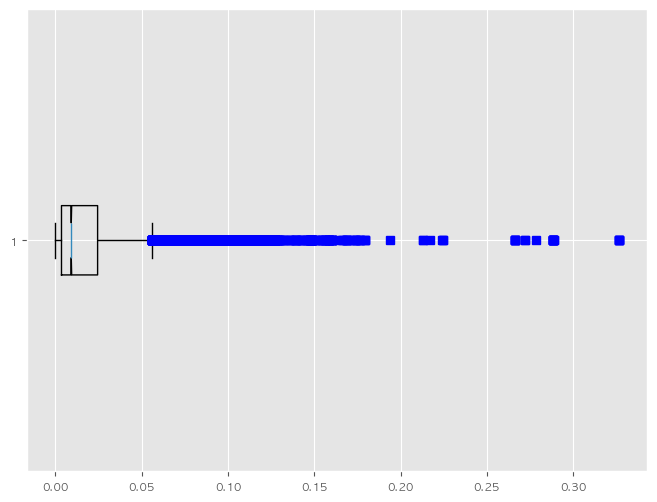

In [113]:
plt.boxplot(df['betweeness'],
            notch=1, # if 'True' then notched box plot
            sym='bs', # symbol: red square
            vert=0 # vertical : if 'False' then horizontal box plot
           )

# plt.ylim([0, 1600])

## distance from station

In [115]:
df["distance_from_station(ft)"].describe()

count   21123.000
mean      927.872
std       716.260
min         0.000
25%       492.714
50%       793.200
75%      1174.057
max     10202.279
Name: distance_from_station(ft), dtype: float64

{'whiskers': [<matplotlib.lines.Line2D at 0x12b51d350>,
 'caps': [<matplotlib.lines.Line2D at 0x12c20d910>,
 'boxes': [<matplotlib.lines.Line2D at 0x12c1ee710>],
 'medians': [<matplotlib.lines.Line2D at 0x12c20cd10>],
 'fliers': [<matplotlib.lines.Line2D at 0x12c20d9d0>],
 'means': []}

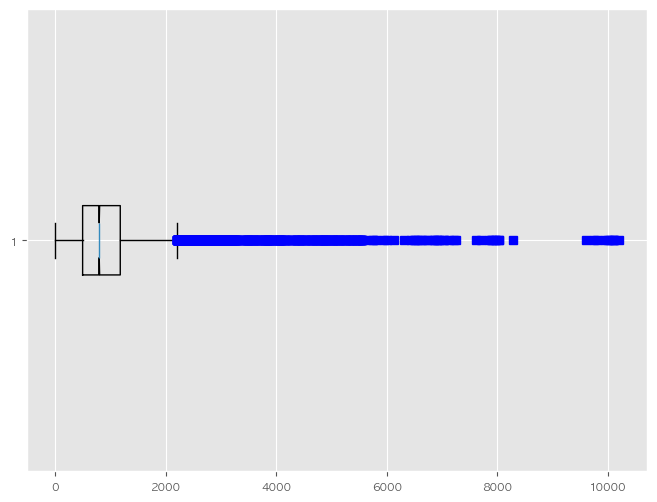

In [116]:
plt.boxplot(df["distance_from_station(ft)"],
            notch=1, # if 'True' then notched box plot
            sym='bs', # symbol: red square
            vert=0 # vertical : if 'False' then horizontal box plot
           )

# plt.ylim([0, 1600])

## annual average daily traffic

In [119]:
df["idw_aadt_2019"].describe()

count   21123.000
mean    11197.792
std      4126.234
min      3130.869
25%      8614.010
50%     10885.009
75%     12902.035
max     98256.184
Name: idw_aadt_2019, dtype: float64

## annual average daily traffic count

In [120]:
df["idw_atvc_2019"].describe()

count   21123.000
mean      158.106
std        21.808
min        55.514
25%       143.297
50%       155.505
75%       172.357
max       604.226
Name: idw_atvc_2019, dtype: float64

## correlations / pairplots 

- 대체로 비슷한류의 피쳐들끼리 당연히 상관관계가 높음: ridership, idw_*
- 특이할만한 점은 user_ratings_total과 ridership, retail_area가 유의미한 양의 상관관계를 갖고있는 반면, rating과는 무관했음
- 트래픽과 유저평점을 매긴횟수가 양의 관계, 그리고 상점거리간의 양의 관계가 있다고 볼 수 있음
- aadt와 geo-location 피쳐인 lat, lng과도 양의 관계를 나타냈음 (특정 지역에는 트래픽이 몰리는 것을 좌표가 반영)
- 상관관계가 굉장히 높은 피쳐들이 여럿있기에, 클러스터링 전 PCA와 같은 차원축소 알고리즘을 적용해도 좋을 것으로 보임

In [20]:
df.columns

Index(['bin', 'name', 'rating', 'user_ratings_total', 'lat', 'lng', 'distance',
       'cnstrct_yr', 'height', 'office_area', 'retail_area',
       'residential_area', 'betweeness', 'ridership_evening',
       'ridership_late_night', 'ridership_midday', 'ridership_morning',
       'ridership_night', 'distance_from_station(ft)', 'idw_aadt_2019',
       'idw_aadt_2020', 'idw_atvc_2019', 'idw_atvc_2020', 'Unnamed: 0',
       'camis', 'boro', 'zipcode', 'cuisine_description',
       'inspection_date_Ymd', 'inspection_year', 'inspection_date_Ymd_next',
       'days_next_inspection', 'flag_restaurant_one_year', 'latitude',
       'longitude'],
      dtype='object')

In [21]:
df.head()

,bin,name,rating,user_ratings_total,lat,lng,distance,cnstrct_yr,height,office_area,retail_area,residential_area,betweeness,ridership_evening,ridership_late_night,ridership_midday,ridership_morning,ridership_night,distance_from_station(ft),idw_aadt_2019,idw_aadt_2020,idw_atvc_2019,idw_atvc_2020,Unnamed: 0,camis,boro,zipcode,cuisine_description,inspection_date_Ymd,inspection_year,inspection_date_Ymd_next,days_next_inspection,flag_restaurant_one_year,latitude,longitude
0,1079104,SAINT RESTAURANT BAR & SPEAKEASY,4.500,655,40.729,-73.987,0.000,1938.000,71.520,12877,5328,13735,0.046,379.489,69.629,347.542,189.587,263.315,1140.867,9224.519,9357.208,139.769,321.254,1877,50096959,Manhattan,10003.000,French,2021-11-09,2021,2021-11-09,0,1,40.729,-73.987
1,1079104,SAINT RESTAURANT BAR & SPEAKEASY,4.500,655,40.729,-73.987,0.000,1938.000,71.520,12877,5328,13735,0.046,379.489,69.629,347.542,189.587,263.315,1140.867,9224.519,9357.208,139.769,321.254,1877,50096959,Manhattan,10003.000,French,2021-11-09,2021,2021-11-09,0,1,40.729,-73.987
2,1079104,SAINT RESTAURANT BAR & SPEAKEASY,4.500,655,40.729,-73.987,0.000,1938.000,71.520,12877,5328,13735,0.046,379.489,69.629,347.542,189.587,263.315,1140.867,9224.519,9357.208,139.769,321.254,1877,50096959,Manhattan,10003.000,French,2021-11-09,2021,2021-11-09,0,1,40.729,-73.987
3,1079104,SAINT RESTAURANT BAR & SPEAKEASY,4.500,655,40.729,-73.987,0.000,1938.000,71.520,12877,5328,13735,0.046,379.489,69.629,347.542,189.587,263.315,1140.867,9224.519,9357.208,139.769,321.254,1877,50096959,Manhattan,10003.000,French,2021-11-09,2021,2021-11-09,0,1,40.729,-73.987
4,1079104,SAINT RESTAURANT BAR & SPEAKEASY,4.500,655,40.729,-73.987,0.000,1938.000,71.520,12877,5328,13735,0.046,379.489,69.629,347.542,189.587,263.315,1140.867,9224.519,9357.208,139.769,321.254,1877,50096959,Manhattan,10003.000,French,2021-11-09,2021,2021-11-09,0,1,40.729,-73.987


In [65]:
df["distance"].describe()

count   917.000
mean      5.708
std      15.677
min       0.000
25%       0.000
50%       0.000
75%       0.902
max     110.039
Name: distance, dtype: float64

In [19]:
df = df.merge(bankrupt, on="bin", how="inner")

In [22]:
df_num = df[
    [
        "rating",
        "user_ratings_total",
        "lat",
        "lng",
        "distance",
        "cnstrct_yr",
        "height",
        "office_area",
        "retail_area",
        "residential_area",
        "betweeness",
        "ridership_evening",
        "ridership_late_night",
        "ridership_midday",
        "ridership_morning",
        "ridership_night",
        "distance_from_station(ft)",
        "idw_aadt_2019",
        "idw_aadt_2020",
        "idw_atvc_2019",
        "idw_atvc_2020",
        "flag_restaurant_one_year",
    ]
]

In [23]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 917 entries, 0 to 916
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   rating                     917 non-null    float64
 1   user_ratings_total         917 non-null    int64  
 2   lat                        917 non-null    float64
 3   lng                        917 non-null    float64
 4   distance                   917 non-null    float64
 5   cnstrct_yr                 917 non-null    float64
 6   height                     917 non-null    float64
 7   office_area                917 non-null    int64  
 8   retail_area                917 non-null    int64  
 9   residential_area           917 non-null    int64  
 10  betweeness                 917 non-null    float64
 11  ridership_evening          917 non-null    float64
 12  ridership_late_night       917 non-null    float64
 13  ridership_midday           917 non-null    float64

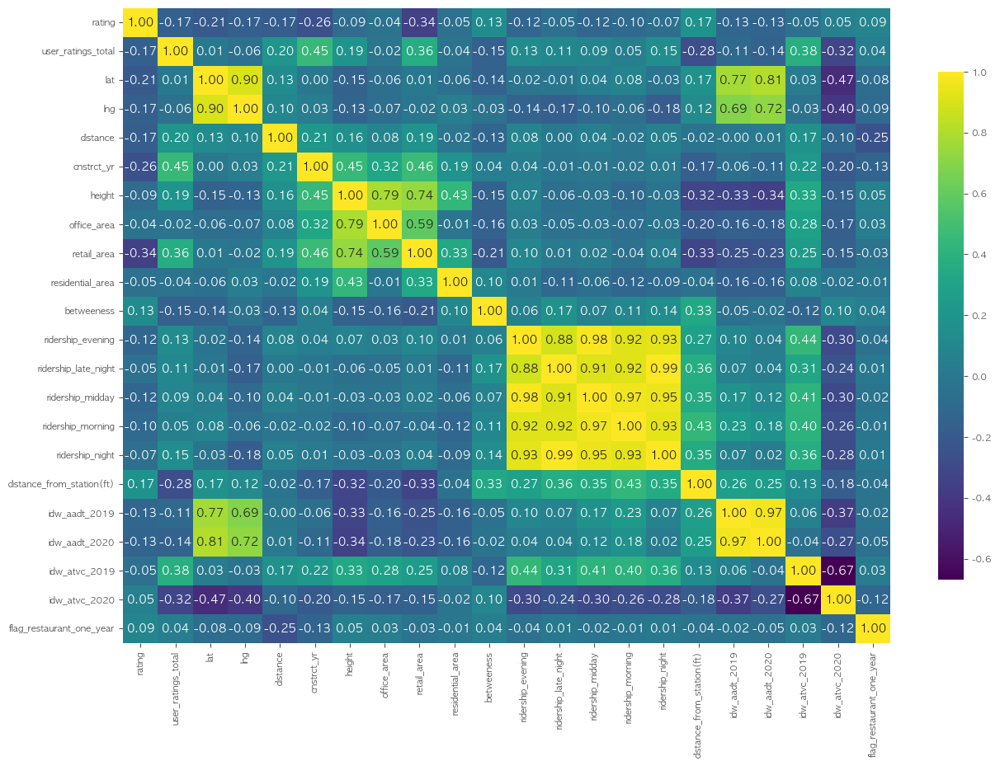

In [24]:
# correlation matrix
corr = df_num.corr()
# mask = np.zeros_like(corr, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(15, 10))
sns.heatmap(
    corr,
    # mask=mask,
    annot=True,
    fmt=".2f",
    # cmap="coolwarm",
    cmap="viridis",
    cbar_kws={"shrink": 0.8},
)
plt.show()

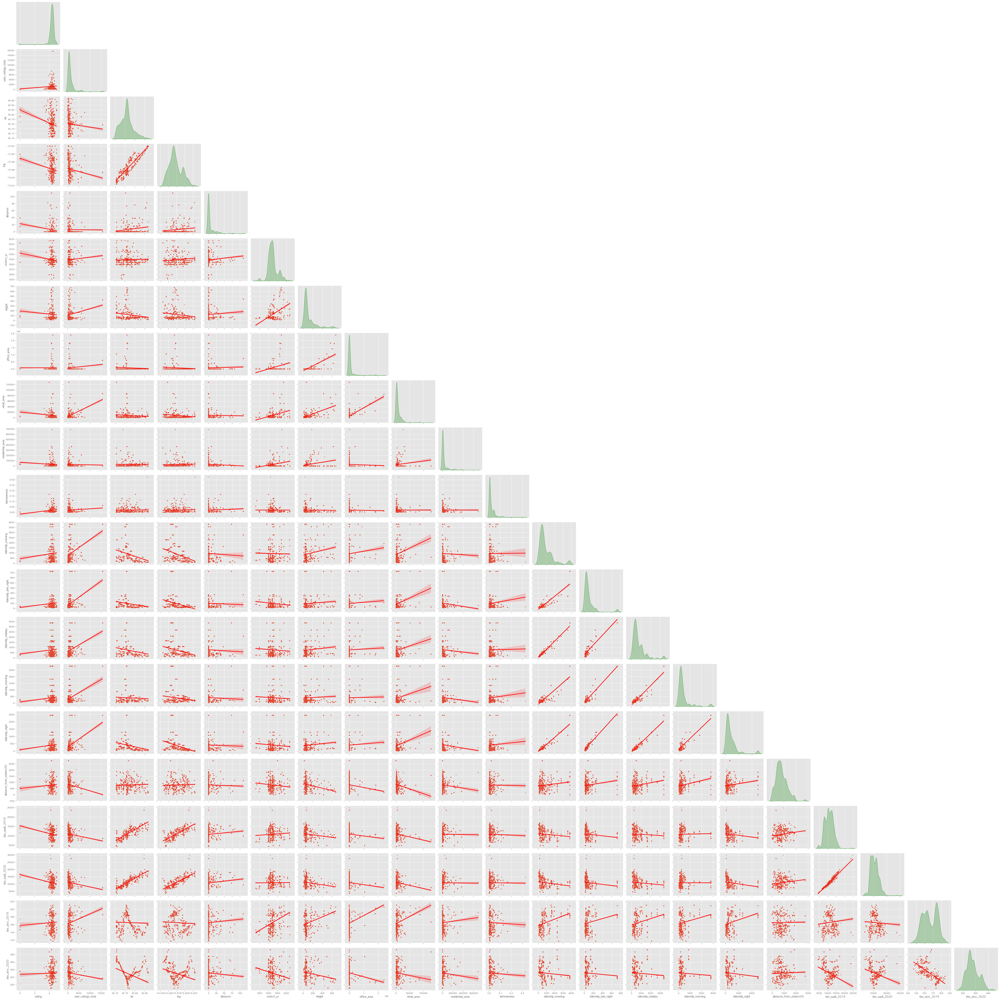

In [136]:
# pairplot for pairwise relationships between variables
sns.pairplot(
    df_num,
    corner=True,
    kind="reg",
    diag_kind="kde",  # diag_kind='hist'
    #  hue='BldgType',
    diag_kws={"color": "green"},
    plot_kws={"scatter_kws": {"s": 5, "alpha": 0.5}, "line_kws": {"color": "red"}},
)
plt.show()

# Modeling
- handling mixed-typed data can be challenging
- try to utilize algorithms like K-Prototypes 

## 좌표로만 예측

In [97]:
# PCA 없이 지역에만 베이스한 모델링
X = df[
    [
        # "rating",
        # "user_ratings_total",
        "lat",
        "lng",
        # "distance",
        # "cnstrct_yr",
        # "height",
        # "office_area",
        # "retail_area",
        # "residential_area",
        # "betweeness",
        # "ridership_evening",
        # "ridership_late_night",
        # "ridership_midday",
        # "ridership_morning",
        # "ridership_night",
        # "distance_from_station(ft)",
        # "idw_aadt_2019",
        # "idw_aadt_2020",
        # "idw_atvc_2019",
        # "idw_atvc_2020",
    ]
]
from sklearn.preprocessing import StandardScaler

# Standardize the combined dataset
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [98]:
from sklearn.cluster import DBSCAN

# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score

# Instantiate and fit DBSCAN
dbscan = DBSCAN(eps=0.7, min_samples=100)
dbscan.fit(X_scaled)
clusters = dbscan.fit_predict(X_scaled)

In [99]:
X["cluster"] = clusters
X["cluster"] = X["cluster"].astype("int")

X_pca_df = pd.DataFrame(X_pca)
X_pca_df["cluster"] = clusters
X_pca_df["cluster"].value_counts()

cluster
 0    2951
-1      22
Name: count, dtype: int64

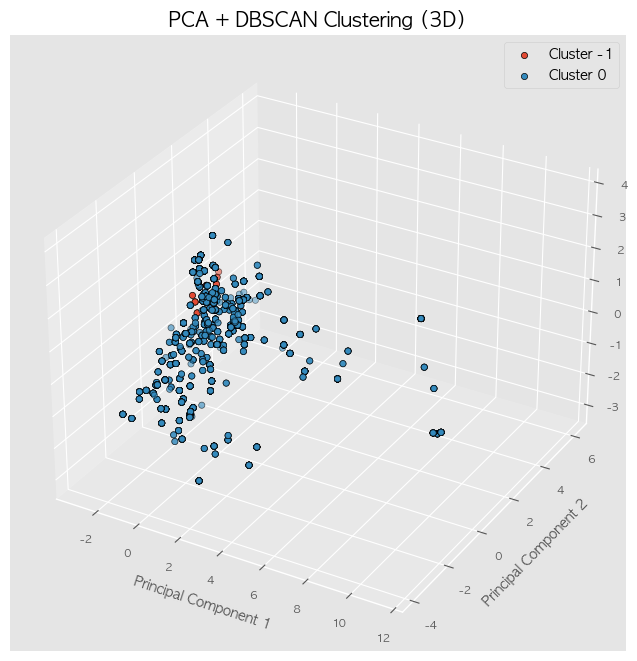

In [100]:
from mpl_toolkits.mplot3d import Axes3D  # Import Axes3D from mpl_toolkits.mplot3d


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")  # Create 3D axis

# Scatter plot for each cluster
for cluster_label in np.unique(clusters):
    cluster_mask = clusters == cluster_label
    ax.scatter(
        X_pca[cluster_mask, 0],
        X_pca[cluster_mask, 1],
        X_pca[cluster_mask, 2],
        label=f"Cluster {cluster_label}",
        cmap="viridis",
        marker="o",
        edgecolors="k",
    )

# Set labels and title
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_zlabel("Principal Component 3")
ax.set_title("PCA + DBSCAN Clustering (3D)")
ax.legend()

plt.show()

In [101]:
# visualize the clusters on the map using lat and lng via folium
import folium

# Create a map centered at the mean latitude and longitude
map = folium.Map(location=[X["lat"].mean(), X["lng"].mean()], zoom_start=12)

# Colors for the clusters
colors = ["red", "blue", "green", "purple", "orange", "darkred", "lightred"]

# Add markers to the map
for i in range(len(X)):
    folium.Marker(
        location=[X.iloc[i]["lat"], X.iloc[i]["lng"]],
        popup=X.iloc[i]["cluster"],
        icon=folium.Icon(color=colors[X.iloc[i]["cluster"].astype("int")]),
    ).add_to(map)

# Display the map
map

# K-Means

In [43]:
X = df[
    [
        # "rating",
        "user_ratings_total",
        "lat",
        "lng",
        # "distance",
        # "cnstrct_yr",
        # "height",
        # "office_area",
        "retail_area",
        # "residential_area",
        "betweeness",
        "ridership_evening",
        "ridership_late_night",
        "ridership_midday",
        "ridership_morning",
        "ridership_night",
        "distance_from_station(ft)",
        "idw_aadt_2019",
        "idw_aadt_2020",
        "idw_atvc_2019",
        "idw_atvc_2020",
        "flag_restaurant_one_year",
    ]
]
# X = df_num.copy()

from sklearn.preprocessing import StandardScaler

# Standardize the combined dataset
scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X.drop("flag_restaurant_one_year", axis=1))
X_scaled = scaler.fit_transform(
    X.drop(["lat", "lng", "flag_restaurant_one_year"], axis=1)
)

In [44]:
from sklearn.decomposition import PCA

# Perform PCA for dimensionality reduction
pca = PCA()  # n_components=6
X_pca = pca.fit_transform(X_scaled)

In [45]:
# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained variance ratio:", explained_variance_ratio)

# Cumulative explained variance ratio
cumulative_explained_variance_ratio = explained_variance_ratio.cumsum()
print("Cumulative explained variance ratio:", cumulative_explained_variance_ratio)

Explained variance ratio: [3.81535809e-01 1.73441425e-01 1.43713276e-01 7.44795963e-02
 6.58076887e-02 5.30035478e-02 4.41748274e-02 3.06763870e-02
 2.01681229e-02 8.50942622e-03 3.04791427e-03 1.09538329e-03
 2.79545641e-04 6.70499274e-05]
Cumulative explained variance ratio: [0.38153581 0.55497723 0.69869051 0.77317011 0.8389778  0.89198134
 0.93615617 0.96683256 0.98700068 0.99551011 0.99855802 0.9996534
 0.99993295 1.        ]


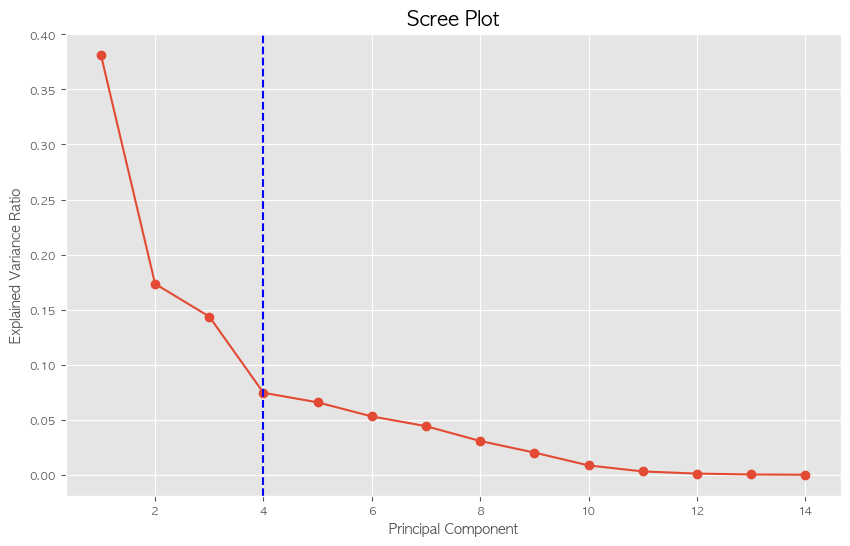

In [46]:
# Scree plot
plt.figure(figsize=(10, 6))
plt.plot(
    range(1, len(pca.explained_variance_ratio_) + 1),
    pca.explained_variance_ratio_,
    marker="o",
    linestyle="-",
)
# vertical line for 4
plt.axvline(x=4, color="b", linestyle="--")
plt.title("Scree Plot")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.grid(True)
plt.show()

In [47]:
# Perform PCA for dimensionality reduction
pca = PCA(n_components=3)  # n_components=3
X_pca = pca.fit_transform(X_scaled)

In [48]:
from sklearn.cluster import KMeans

# Elbow method to determine the optimal number of clusters
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init="k-means++", random_state=42)
    kmeans.fit(X_pca)
    wcss.append(kmeans.inertia_)

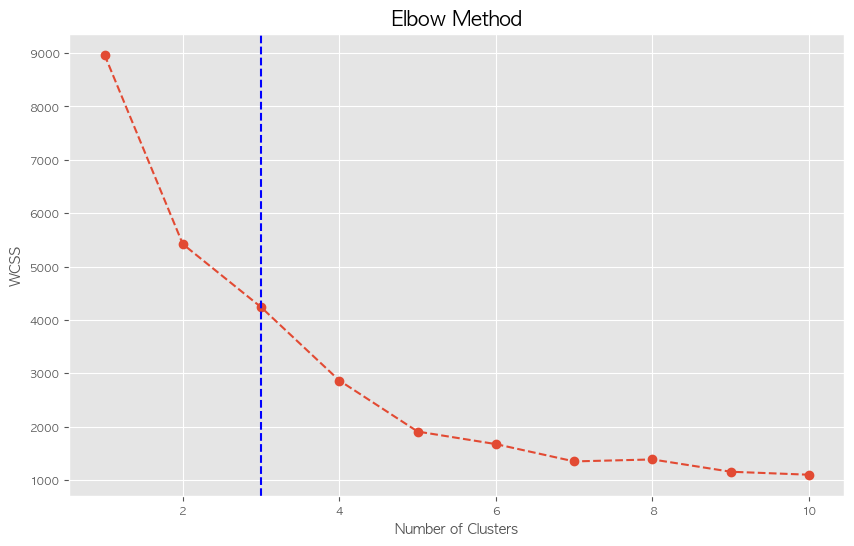

In [49]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker="o", linestyle="--")
# vertical line
plt.axvline(x=3, color="b", linestyle="--")
plt.title("Elbow Method")
plt.xlabel("Number of Clusters")
plt.ylabel("WCSS")
plt.grid(True)
plt.show()

In [50]:
# cluster with 3
kmeans = KMeans(n_clusters=3, init="k-means++", random_state=42)
clusters = kmeans.fit_predict(X_pca)

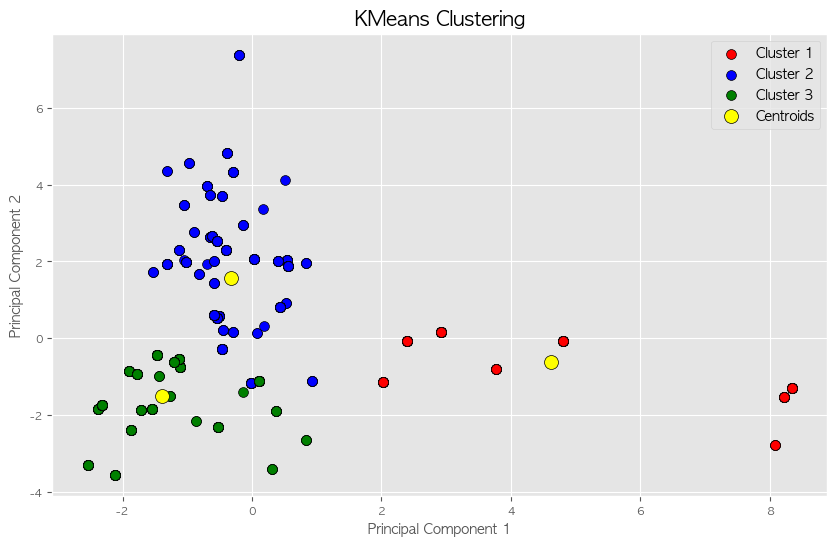

In [34]:
# viz
plt.figure(figsize=(10, 6))
plt.scatter(
    X_pca[clusters == 0, 0],
    X_pca[clusters == 0, 1],
    s=50,
    c="red",
    label="Cluster 1",
    edgecolors="k",
)
plt.scatter(
    X_pca[clusters == 1, 0],
    X_pca[clusters == 1, 1],
    s=50,
    c="blue",
    label="Cluster 2",
    edgecolors="k",
)
plt.scatter(
    X_pca[clusters == 2, 0],
    X_pca[clusters == 2, 1],
    s=50,
    c="green",
    label="Cluster 3",
    edgecolors="k",
)
# plt.scatter(
#     X_pca[clusters == 3, 0],
#     X_pca[clusters == 3, 1],
#     s=50,
#     c="cyan",
#     label="Cluster 4",
#     edgecolors="k",
# )
plt.scatter(
    kmeans.cluster_centers_[:, 0],
    kmeans.cluster_centers_[:, 1],
    s=100,
    c="yellow",
    label="Centroids",
    edgecolors="k",
)
plt.title("KMeans Clustering")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.grid(True)
plt.show()

In [51]:
X["cluster"] = clusters
X["cluster"] = X["cluster"].astype("int")

X_pca_df = pd.DataFrame(X_pca)
X_pca_df["cluster"] = clusters
X_pca_df["cluster"].value_counts()

cluster
1    669
0    208
2     40
Name: count, dtype: int64

In [52]:
X.flag_restaurant_one_year.value_counts(normalize=True)

flag_restaurant_one_year
1   0.991
0   0.009
Name: proportion, dtype: float64

In [54]:
X.groupby("cluster")["user_ratings_total"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,208.000,2018.909,1970.431,518.000,789.000,1183.000,1656.000,6320.000
1,669.000,491.368,323.415,10.000,268.000,425.000,655.000,1482.000
2,40.000,1215.150,701.760,766.000,766.000,766.000,1379.000,3112.000


In [55]:
X.groupby("cluster")["retail_area"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,208.000,18853.793,16422.218,1500.000,4251.000,24479.000,30000.000,85131.000
1,669.000,5982.280,7071.593,0.000,2150.000,3780.000,5328.000,34150.000
2,40.000,7302.000,14909.403,1400.000,1400.000,1400.000,4000.000,51320.000


In [61]:
X.groupby("cluster")["ridership_late_night"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,208.000,132.273,81.469,30.597,41.447,169.794,191.704,267.702
1,669.000,51.255,37.166,12.398,26.509,41.447,60.243,172.035
2,40.000,722.996,0.000,722.996,722.996,722.996,722.996,722.996


In [56]:
X.groupby("cluster")["ridership_evening"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,208.000,1416.441,905.769,447.251,700.163,1436.647,1543.780,3561.012
1,669.000,484.588,397.765,90.942,193.454,434.735,523.740,2296.975
2,40.000,3818.077,0.000,3818.077,3818.077,3818.077,3818.077,3818.077


In [62]:
X.groupby("cluster")["distance"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,208.000,11.610,23.831,0.000,0.000,6.402,9.514,110.039
1,669.000,4.215,12.082,0.000,0.000,0.000,0.000,82.608
2,40.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [60]:
X.groupby("cluster")["idw_aadt_2020"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,208.000,9988.104,1713.573,7859.332,7979.842,10278.587,11638.983,13235.944
1,669.000,10404.799,3362.246,4364.531,8521.443,9357.208,12395.321,27529.706
2,40.000,11299.451,1080.574,8618.172,10827.289,12087.423,12087.423,12087.423


In [58]:
X.groupby("cluster")["idw_atvc_2020"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,208.000,242.250,18.136,212.202,224.824,246.114,255.506,288.407
1,669.000,299.051,46.534,212.355,263.065,300.181,340.768,388.671
2,40.000,248.088,3.224,239.230,247.498,250.073,250.073,250.073


In [64]:
X.groupby("cluster")["betweeness"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,208.000,0.009,0.009,0.000,0.003,0.005,0.010,0.033
1,669.000,0.020,0.030,0.000,0.003,0.007,0.029,0.127
2,40.000,0.045,0.035,0.005,0.005,0.076,0.076,0.076


# Viz

In [ ]:
# 2: most retail area and ridership, moderate vehicle traffic, most central location
# 1: least retail area and ridership, moderate vehicle traffic
# 0: moderate retail area and ridership, most vehicle traffic, least central location

In [53]:
# viz without lat, lng
# visualize the clusters on the map using lat and lng via folium
import folium

# Create a map centered at the mean latitude and longitude
map = folium.Map(location=[X["lat"].mean(), X["lng"].mean()], zoom_start=12)

# Colors for the clusters
colors = ["red", "blue", "green", "purple", "orange", "darkred", "lightred"]

# Add markers to the map
for i in range(len(X)):
    folium.Marker(
        location=[X.iloc[i]["lat"], X.iloc[i]["lng"]],
        popup=X.iloc[i]["cluster"],
        icon=folium.Icon(color=colors[X.iloc[i]["cluster"].astype("int")]),
    ).add_to(map)

# Add flag_restaurant_one_year
# for i in range(len(X)):
#     folium.Marker(
#         location=[X.iloc[i]["lat"], X.iloc[i]["lng"]],
#         popup=X.iloc[i]["flag_restaurant_one_year"],
#         icon=folium.Icon(
#             color=colors[X.iloc[i]["flag_restaurant_one_year"].astype("int")]
#         ),
#     ).add_to(map)


# Display the map
map

In [42]:
# visualize the clusters on the map using lat and lng via folium
import folium

# Create a map centered at the mean latitude and longitude
map = folium.Map(location=[X["lat"].mean(), X["lng"].mean()], zoom_start=12)

# Colors for the clusters
colors = ["red", "blue", "green", "purple", "orange", "darkred", "lightred"]

# Add markers to the map
for i in range(len(X)):
    folium.Marker(
        location=[X.iloc[i]["lat"], X.iloc[i]["lng"]],
        popup=X.iloc[i]["cluster"],
        icon=folium.Icon(color=colors[X.iloc[i]["cluster"].astype("int")]),
    ).add_to(map)

# Add flag_restaurant_one_year
# for i in range(len(X)):
#     folium.Marker(
#         location=[X.iloc[i]["lat"], X.iloc[i]["lng"]],
#         popup=X.iloc[i]["flag_restaurant_one_year"],
#         icon=folium.Icon(
#             color=colors[X.iloc[i]["flag_restaurant_one_year"].astype("int")]
#         ),
#     ).add_to(map)


# Display the map
map

## DBSCAN

In [266]:
from sklearn.cluster import DBSCAN

# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score

# Instantiate and fit DBSCAN
dbscan = DBSCAN(eps=0.7, min_samples=100)
dbscan.fit(X_pca)
clusters = dbscan.fit_predict(X_pca)

DBSCAN(eps=0.7, min_samples=100)

In [282]:
X["cluster"] = clusters
X["cluster"] = X["cluster"].astype("int")

X_pca_df = pd.DataFrame(X_pca)
X_pca_df["cluster"] = clusters
X_pca_df["cluster"].value_counts()

cluster
-1    1228
 2     682
 1     530
 0     417
 3     116
Name: count, dtype: int64

In [283]:
X_pca_df

,0,1,2,cluster
0,0.009,0.990,1.007,-1
1,0.009,0.990,1.007,-1
2,0.009,0.990,1.007,-1
3,0.009,0.990,1.007,-1
4,0.009,0.990,1.007,-1
...,...,...,...,...
2968,8.254,3.634,-2.619,-1
2969,8.254,3.634,-2.619,-1
2970,8.254,3.634,-2.619,-1
2971,8.254,3.634,-2.619,-1


In [286]:
X_pca_df.columns = ["PC1", "PC2", "PC3", "cluster"]

In [287]:
X_pca_df.groupby("cluster")["PC1"].mean()

cluster
-1    1.302
 0   -0.533
 1   -0.568
 2   -1.768
 3    1.121
Name: PC1, dtype: float64

In [288]:
X_pca_df.groupby("cluster")["PC2"].mean()

cluster
-1    0.230
 0   -2.213
 1   -0.113
 2    1.443
 3   -2.450
Name: PC2, dtype: float64

In [289]:
X_pca_df.groupby("cluster")["PC3"].mean()

cluster
-1   -0.149
 0   -0.774
 1    1.604
 2   -0.386
 3   -0.701
Name: PC3, dtype: float64

In [270]:
X.head()

,user_ratings_total,lat,lng,distance,retail_area,betweeness,ridership_evening,ridership_late_night,ridership_midday,ridership_morning,ridership_night,distance_from_station(ft),idw_aadt_2019,idw_aadt_2020,idw_atvc_2019,idw_atvc_2020,cluster
0,2707,40.766,-73.984,19.240,2287,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133,-1
1,2707,40.766,-73.984,19.240,2287,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133,-1
2,2707,40.766,-73.984,19.240,2287,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133,-1
3,2707,40.766,-73.984,19.240,2287,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133,-1
4,2707,40.766,-73.984,19.240,2287,0.025,969.844,85.679,720.965,235.274,483.069,951.765,12083.010,11610.064,182.142,201.133,-1


In [271]:
X.groupby("cluster")["user_ratings_total"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
-1,1228.000,1846.931,2754.651,2.000,491.000,884.000,2024.000,15675.000
0,417.000,530.273,327.726,165.000,249.000,505.000,674.000,1806.000
1,530.000,1013.823,651.810,0.000,432.000,925.000,1435.000,3567.000
2,682.000,604.732,814.404,0.000,182.750,396.000,672.000,6071.000
3,116.000,1300.362,690.472,291.000,769.000,1111.500,2007.000,2184.000


In [272]:
X.groupby("cluster")["ridership_late_night"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
-1,1228.000,169.069,183.837,13.438,61.122,98.033,191.704,722.996
0,417.000,54.823,26.502,18.628,29.575,45.930,83.759,106.515
1,530.000,49.409,20.947,27.316,30.597,41.447,61.122,89.221
2,682.000,35.756,16.186,12.398,23.755,32.105,44.357,74.086
3,116.000,110.661,49.982,87.599,87.599,87.599,121.433,246.533


In [273]:
X.groupby("cluster")["retail_area"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
-1,1228.000,11078.353,18116.270,0.000,1889.500,5000.000,15000.000,128123.000
0,417.000,2965.420,2539.237,0.000,1300.000,1800.000,4000.000,12663.000
1,530.000,14450.677,17336.110,0.000,3080.000,8384.000,19562.000,72162.000
2,682.000,3270.422,3565.260,0.000,1400.000,2175.000,4000.000,34150.000
3,116.000,6783.155,11128.919,1000.000,1530.000,2250.000,3137.000,32600.000


In [274]:
X.groupby("cluster")["distance_from_station(ft)"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
-1,1228.000,896.436,577.216,0.000,451.734,791.172,1291.112,2765.672
0,417.000,782.458,289.695,68.459,559.417,804.356,919.816,1435.515
1,530.000,486.916,270.403,39.605,292.765,471.095,696.732,1147.383
2,682.000,853.181,355.795,134.347,577.354,785.478,1117.840,1948.447
3,116.000,548.909,252.404,78.636,240.826,713.359,732.904,771.624


In [275]:
# X.groupby("cluster")["rating"].describe()

In [276]:
X.groupby("cluster")[["lat", "lng"]].mean()

,lat,lng
cluster,,
-1,40.756,-73.984
0,40.726,-73.994
1,40.761,-73.979
2,40.792,-73.957
3,40.722,-73.998


In [ ]:
X_pcadd

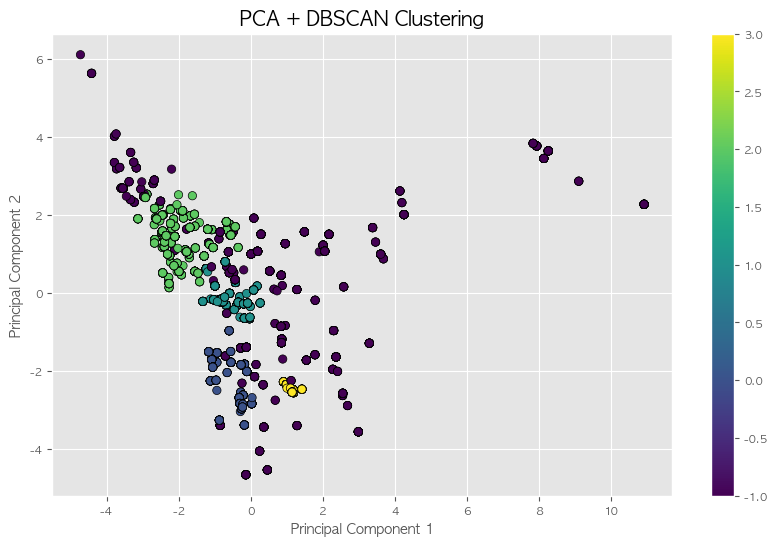

In [278]:
# visualize clusters
plt.figure(figsize=(10, 6))
plt.scatter(
    X_pca_df[0],
    X_pca_df[1],
    c=X_pca_df["c"],
    cmap="viridis",
    marker="o",
    edgecolors="k",
)
plt.title("PCA + DBSCAN Clustering")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.grid(True)
plt.colorbar()

plt.show()

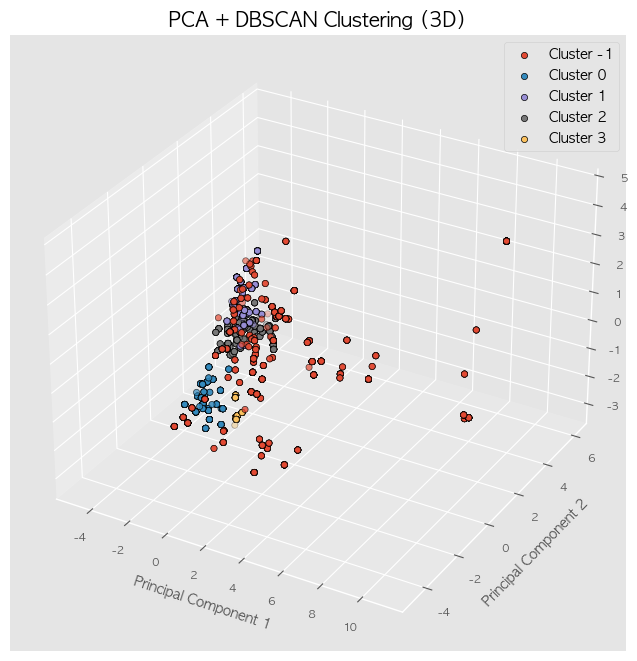

In [279]:
from mpl_toolkits.mplot3d import Axes3D  # Import Axes3D from mpl_toolkits.mplot3d


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")  # Create 3D axis

# Scatter plot for each cluster
for cluster_label in np.unique(clusters):
    cluster_mask = clusters == cluster_label
    ax.scatter(
        X_pca[cluster_mask, 0],
        X_pca[cluster_mask, 1],
        X_pca[cluster_mask, 2],
        label=f"Cluster {cluster_label}",
        cmap="viridis",
        marker="o",
        edgecolors="k",
    )

# Set labels and title
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_zlabel("Principal Component 3")
ax.set_title("PCA + DBSCAN Clustering (3D)")
ax.legend()

plt.show()

In [280]:
# visualize the clusters on the map using lat and lng via folium
import folium

# Create a map centered at the mean latitude and longitude
map = folium.Map(location=[X["lat"].mean(), X["lng"].mean()], zoom_start=12)

# Colors for the clusters
colors = ["red", "blue", "green", "purple", "orange", "darkred", "lightred"]

# Add markers to the map
for i in range(len(X)):
    folium.Marker(
        location=[X.iloc[i]["lat"], X.iloc[i]["lng"]],
        popup=X.iloc[i]["cluster"],
        icon=folium.Icon(color=colors[X.iloc[i]["cluster"].astype("int")]),
    ).add_to(map)

# Display the map
map

# BIRCH

In [193]:
from sklearn.cluster import Birch

# Instantiate and fit Birch
birch = Birch(n_clusters=3)
birch.fit(X_pca)

clusters = birch.predict(X_pca)

AttributeError: 'NoneType' object has no attribute 'split'

In [196]:
pd.DataFrame(X_pca).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       2973 non-null   float64
 1   1       2973 non-null   float64
 2   2       2973 non-null   float64
 3   3       2973 non-null   float64
dtypes: float64(4)
memory usage: 93.0 KB
